In [1]:
import os
import glob
import torch
import torch.utils.data
import datetime
import numpy as np
import pandas as pd
from dateutil import parser
from functools import reduce
import matplotlib.pyplot as plt
from alive_progress import alive_bar

In [2]:
# loading daily& hourly data, and get the user's id who appear in both data
fs = ('daily', 'hourly')
root = os.path.join(os.getcwd(), "out\\")
csv_files = {os.path.basename(p) : glob.glob(os.path.join(p, "*.csv")) for p, _, files in os.walk(root) if len(files) > 0 and os.path.basename(p) in fs}
datasets = {folder:{int(os.path.splitext(os.path.basename(f))[0]): pd.read_csv(f) for f in fs} for folder, fs in csv_files.items()}
ids = list(reduce(set.intersection, [set(dataset.keys()) for dataset in datasets.values()]))

In [3]:
# flatten hourly data into daily data

for id in ids:
    df = datasets['hourly'][id]
    df = df.drop(columns=['Unnamed: 0'])
    dates = {parser.parse(date).strftime('%Y-%m-%d') for date in df['date'].values if all(parser.parse(date).strftime(f'%Y-%m-%d {hour:02d}:00:00') in df['date'].values for hour in range(24))}
    dates = list(dates)
    df = df.set_index('date')
    df = pd.DataFrame({f'{key} {hour:02}': [df.loc[f'{date} {hour:02}:00:00', key] for date in dates] for key in df.keys()[1:] for hour in range(24)})
    df.insert(0, 'date', dates)
    datasets['hourly'][id] = df

In [4]:
# calculate daily Sleep effecent

for id in ids:
    df = datasets['daily'][id]
    df['SleepEffecent'] = df['TotalMinutesAsleep'] / df['TotalTimeInBed']
    datasets['daily'][id] = df.drop(columns=['Unnamed: 0', 'TotalMinutesAsleep', 'TotalTimeInBed', 'TotalSleepRecords'])

In [5]:
# seprate the data, and apply user's context (the mean&std of one user is his context)

train_ids = ids[:-3]
test_ids = ids[-3:]

# get the z-score of np.array (in axis=0)
def z_score(x):
    mean = np.nanmean(x, axis=0)
    std = np.nan_to_num(np.nanstd(x, axis=0), nan=1.0)
    std[std==0] = 1.0
    return (x - mean) / std

def get_ids_dataset(ids):
    X, y = None, None
    for id in ids:
        X_cols = datasets['hourly'][id].iloc[:, 1:].values
        y_col = datasets['daily'][id].drop_duplicates('date').set_index('date', inplace=False).loc[[f'{date} 00:00:00' for date in datasets['hourly'][id]['date']], 'SleepEffecent'].values
        
        if len(y_col.shape) < 2:
            y_col = y_col[:, None]

        assert len(X_cols) == len(y_col), f'{id}'
        
        X_cols = z_score(X_cols)
        #y_col = z_score(y_col)

        X = X_cols if X is None else np.concatenate([X, X_cols], axis=0, dtype=np.float32)
        y = y_col if y is None else np.concatenate([y, y_col], axis=0, dtype=np.float32)

    assert X is not None and y is not None
    return X, y

train_X, train_y = get_ids_dataset(train_ids)
test_X, test_y = get_ids_dataset(test_ids)

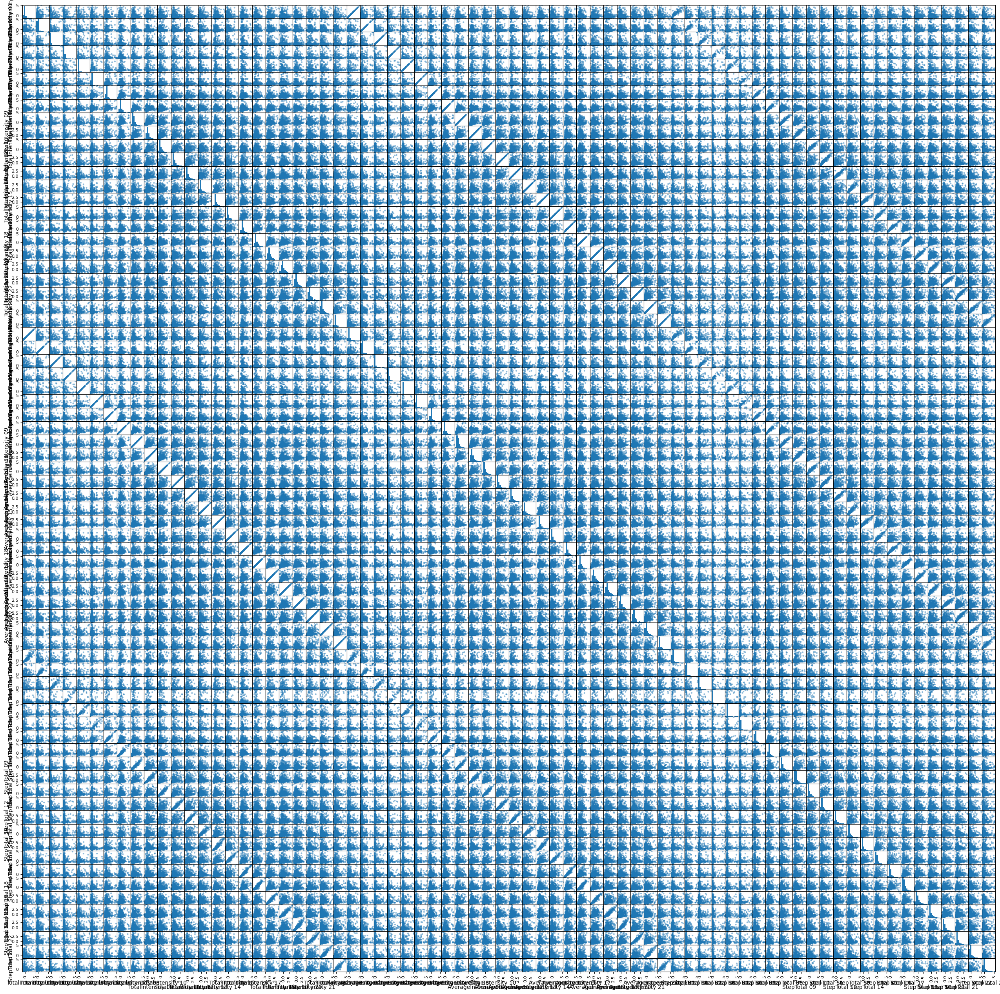

In [6]:
pd.plotting.scatter_matrix(pd.DataFrame(train_X[np.isfinite(train_X).all(axis=-1)], columns=datasets['hourly'][ids[0]].keys()[1:]), figsize=(32, 32))
pass

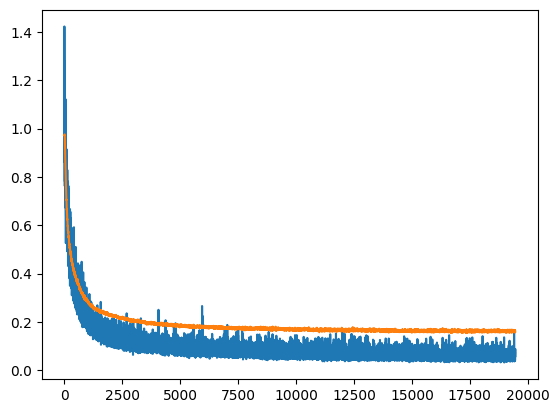

0.1610507369041443

In [7]:
class AutoEncoder(torch.nn.Module):
    def __init__(self, features:int, coded:int, hidden_mult:int=4) -> None:
        super().__init__()

        self.encoder = torch.nn.Sequential(
            torch.nn.Linear(features, features*hidden_mult), torch.nn.BatchNorm1d(features*hidden_mult), torch.nn.ReLU(),
            torch.nn.Linear(features*hidden_mult, coded*hidden_mult), torch.nn.BatchNorm1d(coded*hidden_mult), torch.nn.ReLU(),
            torch.nn.Linear(coded*hidden_mult, coded*hidden_mult), torch.nn.BatchNorm1d(coded*hidden_mult),torch.nn.ReLU(),
            torch.nn.Linear(coded*hidden_mult, coded)
        )

        self.decoders = torch.nn.Sequential(
            torch.nn.Linear(coded, coded*hidden_mult), torch.nn.BatchNorm1d(coded*hidden_mult), torch.nn.ReLU(),
            torch.nn.Linear(coded*hidden_mult, coded*hidden_mult), torch.nn.BatchNorm1d(coded*hidden_mult), torch.nn.ReLU(),
            torch.nn.Linear(coded*hidden_mult, features*hidden_mult), torch.nn.BatchNorm1d(features*hidden_mult), torch.nn.ReLU(),
            torch.nn.Linear(features*hidden_mult, features)
        )

    def forward(self, x:torch.Tensor) -> torch.Tensor:
        x = self.encoder(x)
        x = self.decoders(x)
        return x
    
ae = AutoEncoder(train_X.shape[-1], 36)
optim = torch.optim.AdamW(ae.parameters(), lr=1e-4, weight_decay=1e-2, amsgrad=True)
criterion = torch.nn.MSELoss()

train_dataloader = torch.utils.data.DataLoader(torch.utils.data.TensorDataset(torch.from_numpy(train_X[np.isfinite(train_X).all(axis=-1)]).float()), shuffle=True, batch_size=32)
test_dataset = torch.as_tensor(test_X[np.isfinite(test_X).all(axis=-1)]).float()


train_losses = []
test_losses = []
epoch_cnt = 1024
with alive_bar(epoch_cnt, force_tty=True, receipt=False, refresh_secs=1/10, calibrate=50, spinner='classic') as bar:
    for epoch in range(epoch_cnt):
        for batch, [ys, ] in enumerate(train_dataloader):
            ae.train()

            optim.zero_grad()
            loss = criterion(ae(ys), ys)
            loss.backward()
            optim.step()

            train_losses.append(loss.item())

            with torch.no_grad():
                ae.eval()
                test_losses.append(criterion(ae(test_dataset), test_dataset).item())

        bar()

plt.plot(train_losses)
plt.plot(test_losses)
plt.show()
test_losses[-1]

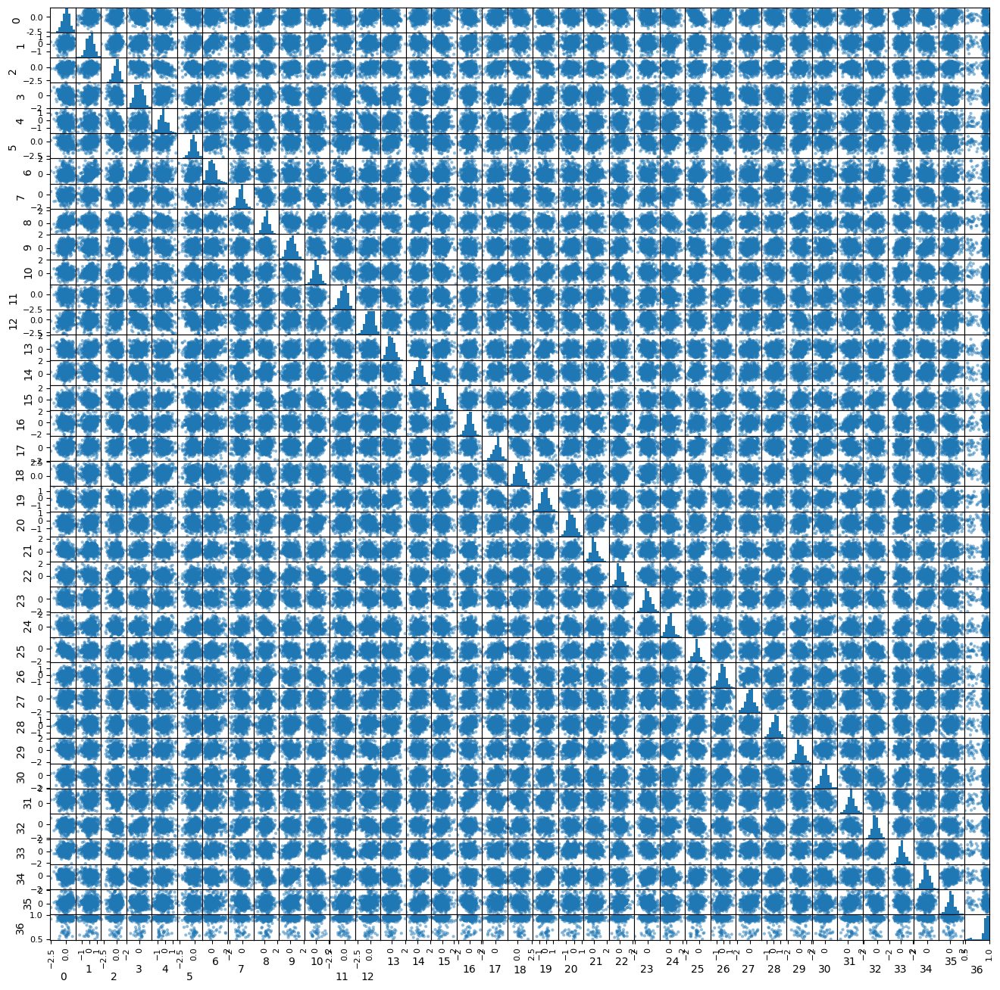

In [8]:
pd.plotting.scatter_matrix(pd.DataFrame(np.concatenate([ae.encoder(torch.from_numpy(train_X[np.isfinite(train_X).all(axis=-1)]).float()).numpy(force=True), train_y], axis=-1)), figsize=(16, 16))
pass

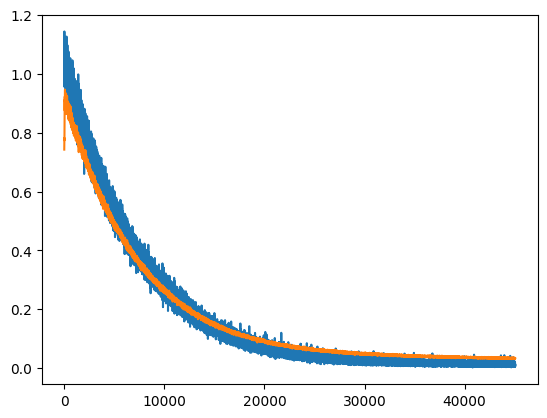

In [9]:
# using a DNN to predict sleep effcient
assert train_X is not None and train_y is not None
assert test_X is not None and test_y is not None

pred_model = torch.nn.Sequential(
    torch.nn.Linear(36, 64), torch.nn.BatchNorm1d(64), torch.nn.ReLU(),
    torch.nn.Linear(64, 32), torch.nn.BatchNorm1d(32), torch.nn.ReLU(),
    torch.nn.Linear(32, 8), torch.nn.BatchNorm1d(8), torch.nn.ReLU(),
    torch.nn.Linear(8, 1)
)
optim = torch.optim.AdamW(pred_model.parameters(), lr=1e-5, weight_decay=1e-2, amsgrad=True)
criterion = torch.nn.MSELoss()

train_dataloader = torch.utils.data.DataLoader(
    torch.utils.data.TensorDataset(
        torch.from_numpy(train_X[np.isfinite(train_X).all(axis=-1) & np.isfinite(train_y).all(axis=-1)]).float(),
        torch.from_numpy(train_y[np.isfinite(train_X).all(axis=-1) & np.isfinite(train_y).all(axis=-1)]).float(),
    ), shuffle=True, batch_size=32)
torch_test_X = torch.as_tensor(test_X[np.isfinite(test_X).all(axis=-1) & np.isfinite(test_y).all(axis=-1)]).float()
torch_test_y = torch.as_tensor(test_y[np.isfinite(test_X).all(axis=-1) & np.isfinite(test_y).all(axis=-1)]).float()

train_losses = []
test_losses = []
epoch_cnt = 4096

with alive_bar(epoch_cnt, force_tty=True, receipt=False, refresh_secs=1/10, calibrate=50, spinner='classic') as bar:
    for epoch in range(epoch_cnt):
        for batch, [Xs, ys] in enumerate(train_dataloader):
            with torch.no_grad():
                ae.eval()
                Xs = ae.encoder(Xs)
            
            pred_model.train()
            optim.zero_grad()
            loss = criterion(pred_model(Xs), ys)
            loss.backward()
            optim.step()

            train_losses.append(loss.item())

            with torch.no_grad():
                ae.eval()
                pred_model.eval()
                test_losses.append(criterion(pred_model(ae.encoder(torch_test_X)), torch_test_y).item())

        bar()

plt.plot(train_losses)
plt.plot(test_losses)
plt.show()

In [10]:
with torch.no_grad():
    ae.eval()
    pred_model.eval()
    print(torch.nn.L1Loss()(pred_model(ae.encoder(torch_test_X)), torch_test_y).item())
with torch.no_grad():
    ae.eval()
    pred_model.eval()
    print(torch.nn.MSELoss()(pred_model(ae.encoder(torch_test_X)), torch_test_y).item())

0.13421593606472015
0.03346054255962372


In [11]:
for x, _ in zip(torch_test_X, range(5)):
    x.requires_grad = True
    y = pred_model(ae.encoder(x[None, : ]))[0]

    g, = torch.autograd.grad(y, x) # dy/dx

    for i, _ in zip(torch.argsort(torch.abs(g)), range(10)):
        print(f'{"↑" if g[i] > 0 else "↓"} {list(datasets["hourly"][id].keys())[i+1]}')
    print('\n\n')

↑ TotalIntensity 15
↑ AverageIntensity 08
↑ AverageIntensity 14
↓ TotalIntensity 03
↑ StepTotal 08
↑ AverageIntensity 06
↓ StepTotal 18
↓ AverageIntensity 17
↑ AverageIntensity 15
↓ AverageIntensity 03



↑ TotalIntensity 16
↓ TotalIntensity 00
↑ TotalIntensity 01
↓ TotalIntensity 17
↑ StepTotal 15
↑ StepTotal 20
↓ TotalIntensity 21
↑ TotalIntensity 13
↓ TotalIntensity 15
↓ AverageIntensity 22



↓ AverageIntensity 22
↓ TotalIntensity 10
↑ AverageIntensity 12
↑ StepTotal 21
↑ AverageIntensity 11
↓ AverageIntensity 16
↑ TotalIntensity 19
↓ AverageIntensity 02
↓ StepTotal 07
↓ AverageIntensity 10



↑ StepTotal 07
↓ AverageIntensity 01
↓ AverageIntensity 12
↑ TotalIntensity 18
↑ AverageIntensity 05
↑ StepTotal 01
↓ StepTotal 03
↓ TotalIntensity 16
↑ StepTotal 21
↓ TotalIntensity 00



↓ StepTotal 04
↓ AverageIntensity 17
↓ AverageIntensity 06
↓ StepTotal 20
↑ AverageIntensity 14
↓ TotalIntensity 09
↑ AverageIntensity 23
↓ StepTotal 23
↑ TotalIntensity 17
↑ TotalIntensity 12





In [12]:
torch.save({
    'auto_encoder': ae.state_dict(),
    'pred_model': pred_model.state_dict(),
}, 'hourly_model.pth')